In [1]:
#downloading data
!git clone https://github.com/rslim087a/track.git

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 13.79 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPool2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import ntpath
import random

In [7]:
datadir="track"
## proving column name
columns=['center','left','right','steering','throttle','reverse','speed']
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)
## displaying imgage path
pd.set_option('display.max_colwidth',1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [8]:
## remove extra path from image path
def path_leaf(path):
  head,tail=ntpath.split(path)
  return tail

data['center']=data['center'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


<BarContainer object of 25 artists>

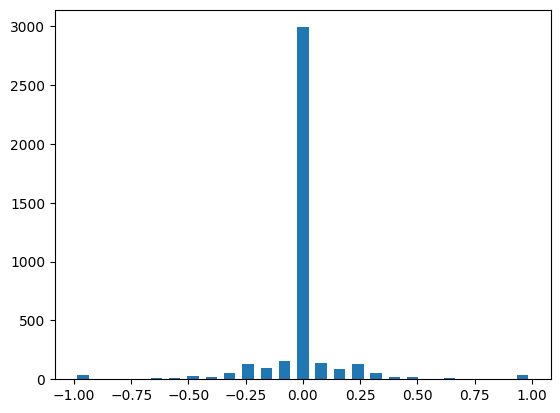

In [9]:
### visvualising the data we collected from stimulator using histogram

num_bins=25;
samples_per_bin=400;
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:]) * 0.5
plt.bar(center,hist,width=0.05)

In [13]:
 ## we can see our data is imbalanced as we have too many zeroa angle steering value

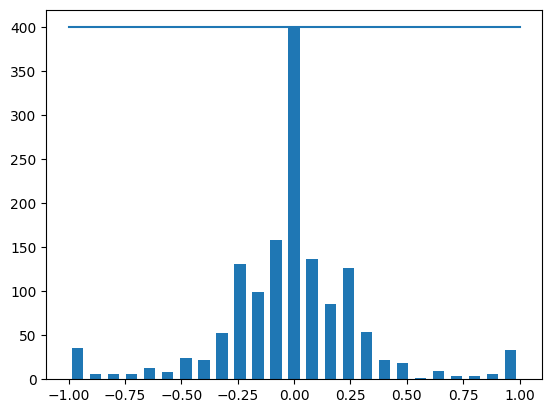

In [26]:
num_bins=25;
samples_per_bin=400;
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:]) * 0.5
plt.bar(center,hist,width=0.05)
### defining threshold of zeros steering value depending on samples_per_bin
plt.plot((np.min(data['steering']),np.max(data['steering'])),(samples_per_bin,samples_per_bin))

In [17]:
#### this shows that this many values of zero we can keep to make it a balanced dataset

In [20]:
## shape of data
print('total data :', len(data))
print(data.shape)

total data : 4053
(4053, 7)


In [21]:
### data balancing

In [23]:
remove_list=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
      list_.append(i)
  list_=shuffle(list_)
  list_=list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed : ',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('remaining :',len(data))


removed :  2590
remaining : 1463


<BarContainer object of 25 artists>

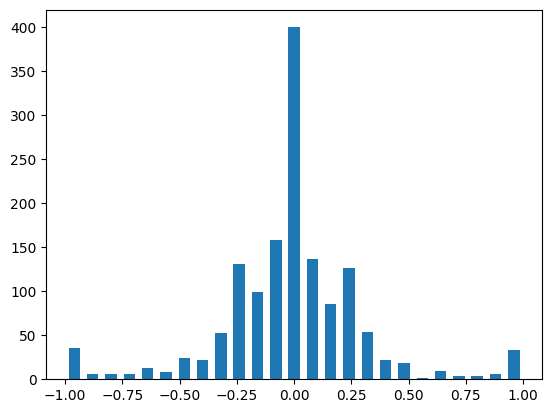

In [24]:
num_bins=25;
hist,bins=np.histogram(data['steering'],num_bins)
plt.bar(center,hist,width=0.05)

In [25]:
### we can see the data is about to be normally distributed

In [28]:
### function wich return image path and steering angle as numpy array

def load_img_steering(datadir,df):
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i]
    center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,center.strip()))
    steering.append(float(indexed_data[3]))
    ## left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    ## right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)

  image_paths=np.asarray(image_path)
  steerings=np.asarray(steering)
  return image_paths,steerings

In [30]:
image_paths, steerings = load_img_steering(datadir+'/IMG',data)

<ipython-input-28-7d59f8c14353>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
<ipython-input-28-7d59f8c14353>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-28-7d59f8c14353>:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3])+0.15)
<ipython-input-28-7d59f8c14353>:16: Futu

In [35]:
image_paths

array(['track/IMG/center_2018_07_16_17_11_44_209.jpg',
       'track/IMG/left_2018_07_16_17_11_44_209.jpg',
       'track/IMG/right_2018_07_16_17_11_44_209.jpg', ...,
       'track/IMG/center_2018_07_16_17_16_31_329.jpg',
       'track/IMG/left_2018_07_16_17_16_31_329.jpg',
       'track/IMG/right_2018_07_16_17_16_31_329.jpg'], dtype='<U44')

In [36]:
len(image_paths)

4389

In [33]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15])

In [38]:
len(steerings)

4389

In [39]:
### train test split

In [40]:
X_train,X_test,Y_train,Y_test=train_test_split(image_paths,steerings,test_size=0.33,random_state=45)

In [44]:
print("training samples :",len(X_train))

training samples : 2940


In [43]:
print("testing samples :",len(X_test))

testing samples : 1449


In [45]:
### plotting distribution of training and testing dataset

Text(0.5, 1.0, 'testing set')

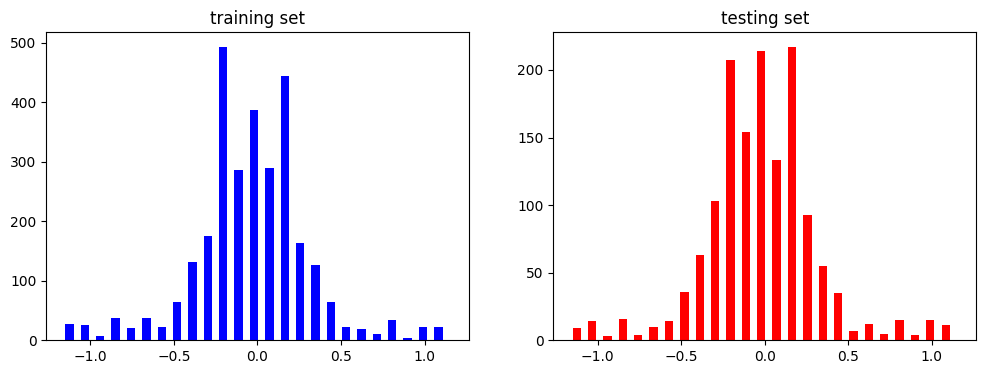

In [47]:
fig,axes = plt.subplots(1,2,figsize=(12,4))
axes[0].hist(Y_train,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('training set')
axes[1].hist(Y_test,bins=num_bins,width=0.05,color='red')
axes[1].set_title('testing set')

In [48]:
### we can see distribution of data is quite similar

In [49]:
### data augmentation

Text(0.5, 1.0, 'Zoomed Image')

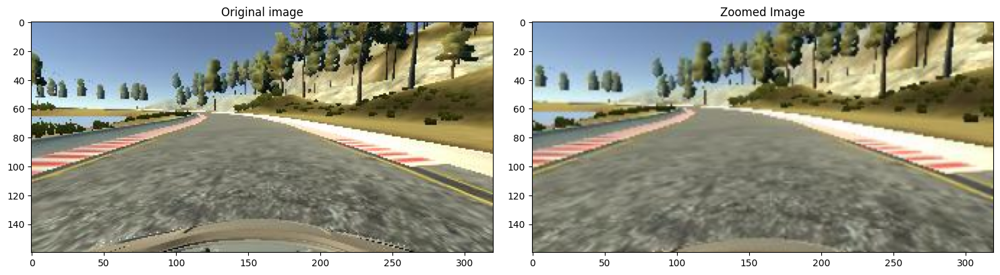

In [52]:
## 1. zooming technique
def zoom(image):
  zoom=iaa.Affine(scale=(1,1.3))
  image=zoom.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,20))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original image')

axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'panned Image')

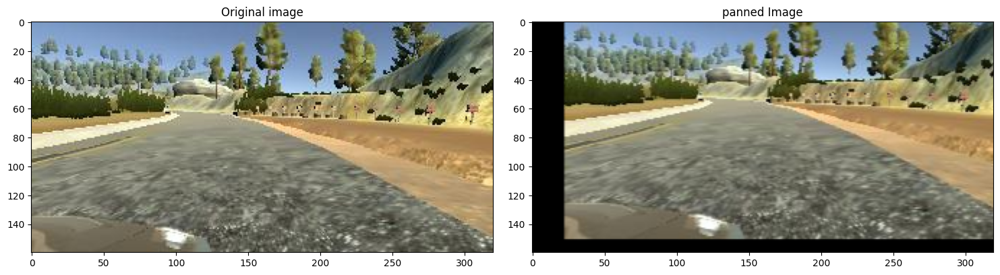

In [54]:
## 2. pan image
def pan(image):
  pan=iaa.Affine(translate_percent={'x':(-0.1,0.1), 'y':(-0.1,0.1)})
  image=pan.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
panned_image=pan(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,20))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original image')

axes[1].imshow(panned_image)
axes[1].set_title('panned Image')

Text(0.5, 1.0, 'brightned Image')

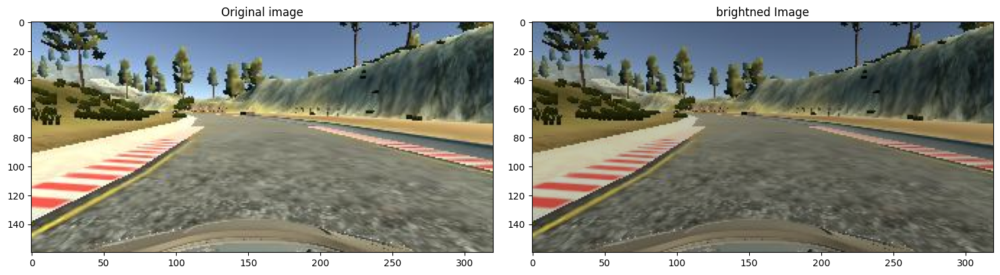

In [55]:
### 3. britening image
def img_random_brightness(image):
  brightness=iaa.Multiply((0.2,1.2))
  image=brightness.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
brightned_image=img_random_brightness(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,20))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original image')

axes[1].imshow(brightned_image)
axes[1].set_title('brightned Image')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.09781816')

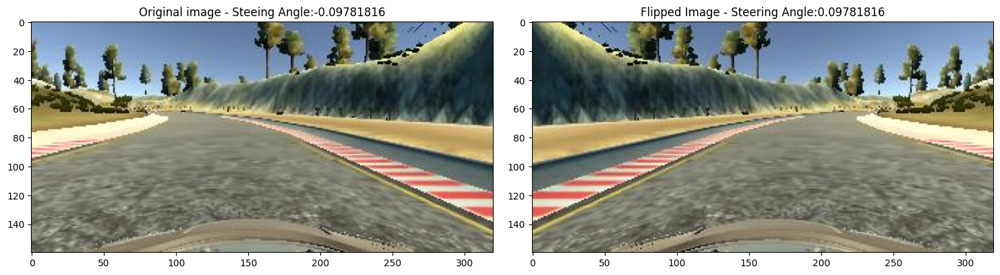

In [57]:
### 4. image random flip
def img_random_flip(image,steering_angle):
  image=cv2.flip(image,1)
  steering_angle=-steering_angle
  return image,steering_angle

random_index=random.randint(0,100)
image=image_paths[random_index]
steering_angle=steerings[random_index]

original_image=mpimg.imread(image)
flipped_image,flipped_steering_angle=img_random_flip(original_image,steering_angle)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original image - '+'Steeing Angle:' + str(steering_angle))

axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image - '+'Steering Angle:' +str(flipped_steering_angle))

In [59]:
### applying data augmentation on dataset

def random_augment(image,steering_angle):
  image=mpimg.imread(image)
  if(np.random.rand()<0.5):
    image=pan(image)
  if(np.random.rand()<0.5):
    image=zoom(image)
  if(np.random.rand()<0.5):
    image=img_random_brightness(image)
  if(np.random.rand()<0.5):
    image,steering_angle=img_random_flip(image,steering_angle)

  return image,steering_angle

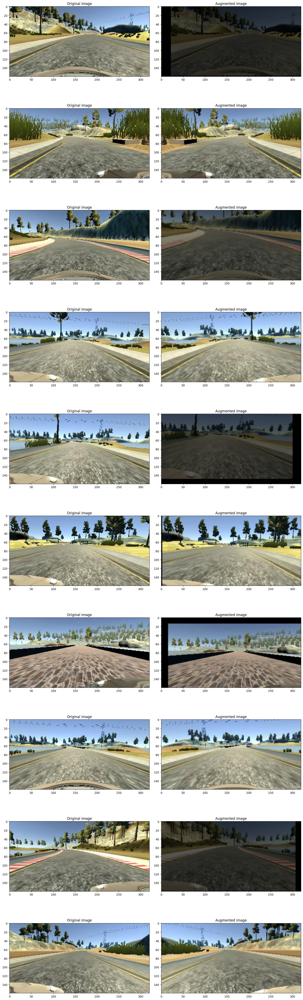

In [60]:
### testing augmentation on random 50 images

ncol=2
nrow=10

fig,axes=plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
  randnum=random.randint(0,len(image_paths)-1)
  random_image=image_paths[randnum]
  random_steering=steerings[randnum]

  original_image=mpimg.imread(random_image)
  augmented_image,steering=random_augment(random_image,random_steering)

  axes[i][0].imshow(original_image)
  axes[i][0].set_title("Original image")

  axes[i][1].imshow(augmented_image)
  axes[i][1].set_title("Augmented image")

In [62]:
### preprocess image data

def img_preprocess(img):
  ### cropping image with height=60 and width=135
  img=img[60:135,:,:]
  ## since we are converting rgb image to yuv image it is necesessary because we will
  ## be using NVidia model for training so it prefers input in YUV format rather than RGB
  ## we can also use other pre-trained model but nvidia model gives state of art
  ## performance in self driving car.
  img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  ### next step is to apply gaussian blur to paas to nvidia model
  img=cv2.GaussianBlur(img,(3,3),0)
  ### input shape of image is (200,66) of nvidia model
  img=cv2.resize(img,(200,66))
  ### scaling image size for better training
  img=img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

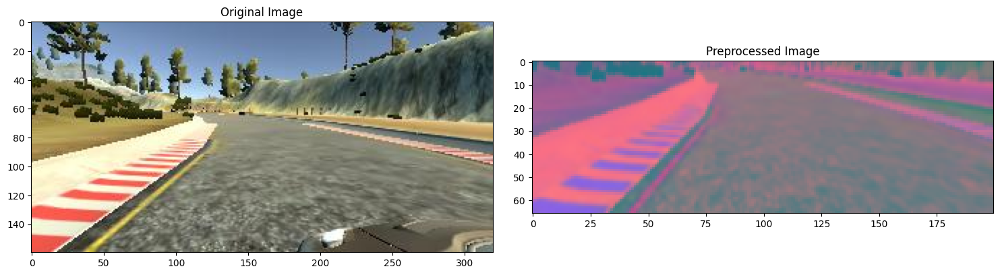

In [63]:
### testing on random image

image=image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocess(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,20))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi


In [ ]:
### generating batch of images using data augmentation

def batch_generator(image_paths,steering_ang,batch_size,istraining):
  while True:
    batch_img=[]
    batch_steering=[]

    for i in range(batch_size):
      random_index=random.randint(0,len(image_paths)-1)

      if istraining:
        im,steering=random_augment(image_paths[random_index],steering_ang[random_index])

      else:
        im=mpimg.imread(image_paths[random_index])
        steering=steering_ang[random_index]

      im=img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img),np.asarray(batch_steering))


In [ ]:
 ### testing batch generated

X_train_gen,Y_train_gen = next(batch_generator(X_train,Y_train,1,1))
X_test_gen,Y_test_gen=next(batch_generator(X_test,Y_test,1,0))

In [ ]:
fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axes[0].imshow(X_train_gen[0])
axes[0].set_title('Training Image')

axes[1].imshow(X_test_gen[0])
axes[1].set_title('Testing Image')

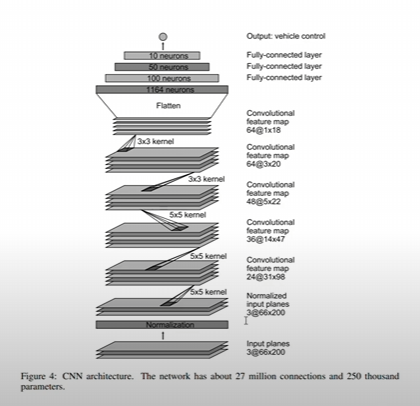

In [ ]:
### function of training nvidia model

def nvidia_model():
  model=Sequential()
  model.add(Conv2D(24,(5,5),strides=(2,2),input_shape=(66,200,3),activation='elu'))
  model.add(Conv2D(36,(5,5),strides=(2,2),activation='elu'))
  model.add(Conv2D(48,(5,5),strides=(2,2),activation='elu'))
  model.add(Conv2D(64,(5,5),activation='elu'))
  # model.add(Conv2D(64,(3,3),activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Flatten())
  model.add(Dense(100,activation='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(50,activation='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(10,activation='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(1))

  optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse',optimizer=optimizer)
  return model

In [ ]:
### training the model

model=nvidia_model()
print(model.summary())

In [ ]:

history=model.fit(
                  batch_generator(X_train, Y_train, 100, 1),
                  steps_per_epoch=300,
                  epochs=50,
                  validation_data=batch_generator(X_test,Y_test,100,0),
                  validation_steps=200,
                  verbose=1,
                  shuffle=1
                  )

In [ ]:
model.save('updated_model.h5')


In [ ]:
model.save('updated_my_model.keras')
